# Explore the dataset


In this notebook, we will perform an EDA (Exploratory Data Analysis) on the processed Waymo dataset (data in the `processed` folder). In the first part, you will create a function to display 

In [3]:
from utils import get_dataset
import glob
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import numpy as np
import tensorflow as tf

%matplotlib inline

In [4]:
dataset = get_dataset("../data/processed/*.tfrecord")

INFO:tensorflow:Reading unweighted datasets: ['../data/processed/*.tfrecord']
INFO:tensorflow:Reading record datasets for input file: ['../data/processed/*.tfrecord']
INFO:tensorflow:Number of filenames to read: 200
Instructions for updating:
Use `tf.data.Dataset.interleave(map_func, cycle_length, block_length, num_parallel_calls=tf.data.AUTOTUNE)` instead. If sloppy execution is desired, use `tf.data.Options.experimental_deterministic`.
Instructions for updating:
Use `tf.data.Dataset.map()


2022-09-26 20:37:18.951313: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-09-26 20:37:18.951939: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-09-26 20:37:18.955826: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-09-26 20:37:18.956423: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-09-26 20:37:18.957007: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from S

## Write a function to display an image and the bounding boxes

Implement the `display_images` function below. This function takes a batch as an input and display an image with its corresponding bounding boxes. The only requirement is that the classes should be color coded (eg, vehicles in red, pedestrians in blue, cyclist in green).

In [5]:
def display_images(batch):
    
    # Parsing image and annotation data from the tfrecord batch
    img = batch['image'].numpy()
    bboxes = batch['groundtruth_boxes'].numpy()
    classes = batch['groundtruth_classes'].numpy()

    # color mapping of classes
    color_code = {1: [1, 0, 0], 2: [0, 0, 1], 4: [0, 1, 0]}

    # Setup plot size
    img_shape = img.shape
    _, ax = plt.subplots(1,figsize=(20, 10))

    # Draw bounding boxes with class colors
    for class_num, bbox_pts in zip(classes, bboxes):
        y1, x1, y2, x2 = bbox_pts
        y1 = y1*img_shape[0]
        x1 = x1*img_shape[1]
        y2 = y2*img_shape[0]
        x2 = x2*img_shape[1]
        rect = patches.Rectangle((x1, y1), x2- x1, y2-y1, facecolor='none', edgecolor=color_code[class_num])
        ax.add_patch(rect)

    # Display the image with bounding box
    imgplot = plt.imshow(img)
    plt.show()

## Display 10 images 

Using the dataset created in the second cell and the function you just coded, display 10 random images with the associated bounding boxes. You can use the methods `take` and `shuffle` on the dataset.

2022-09-26 20:37:28.645832: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:185] None of the MLIR Optimization Passes are enabled (registered 2)


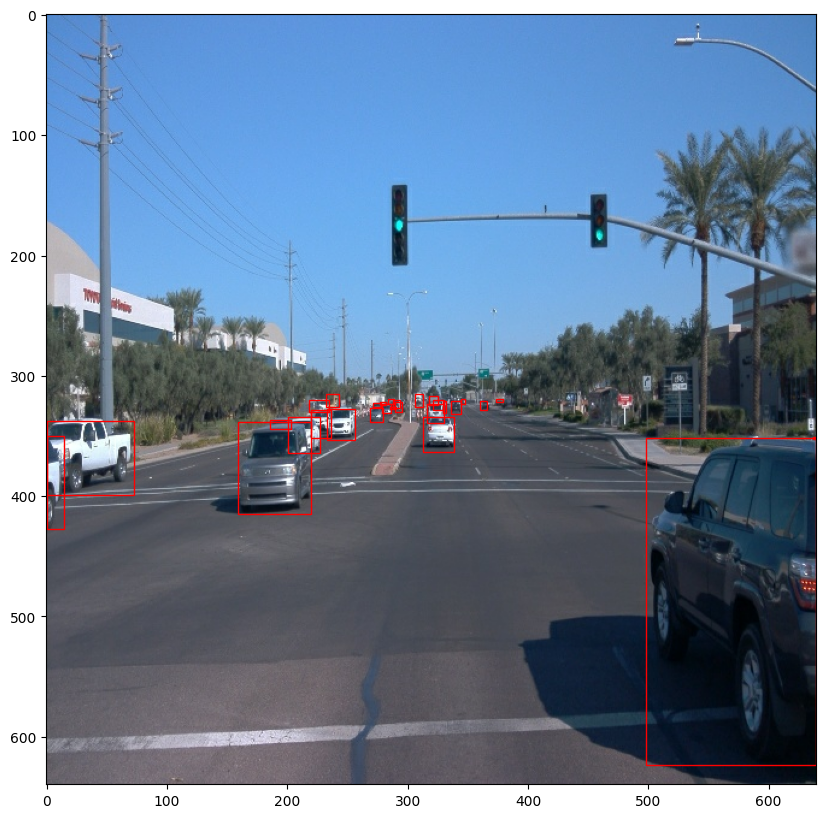

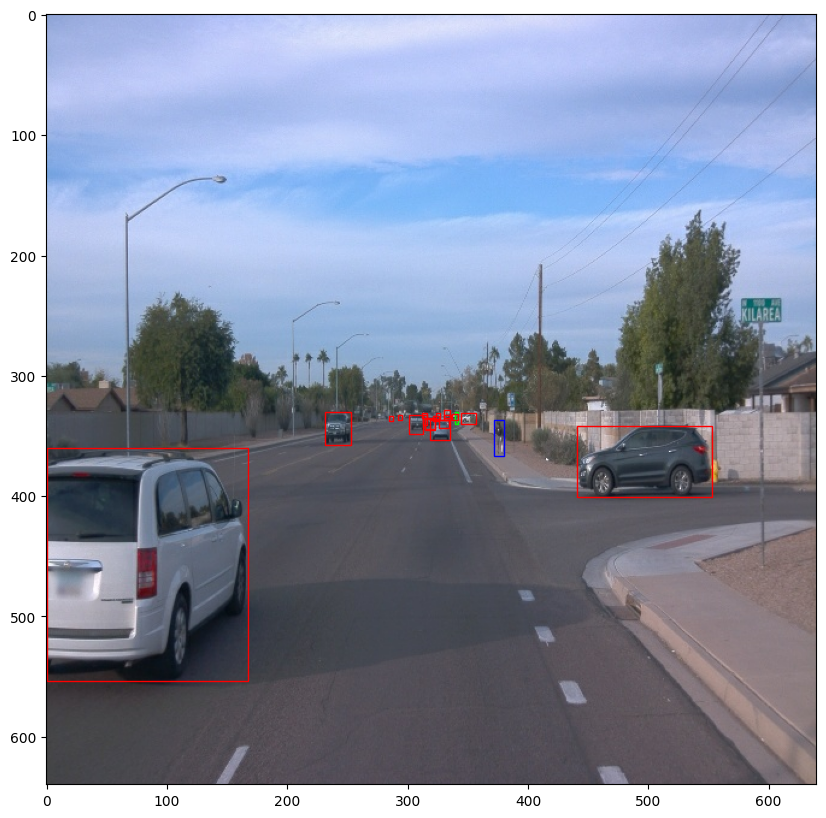

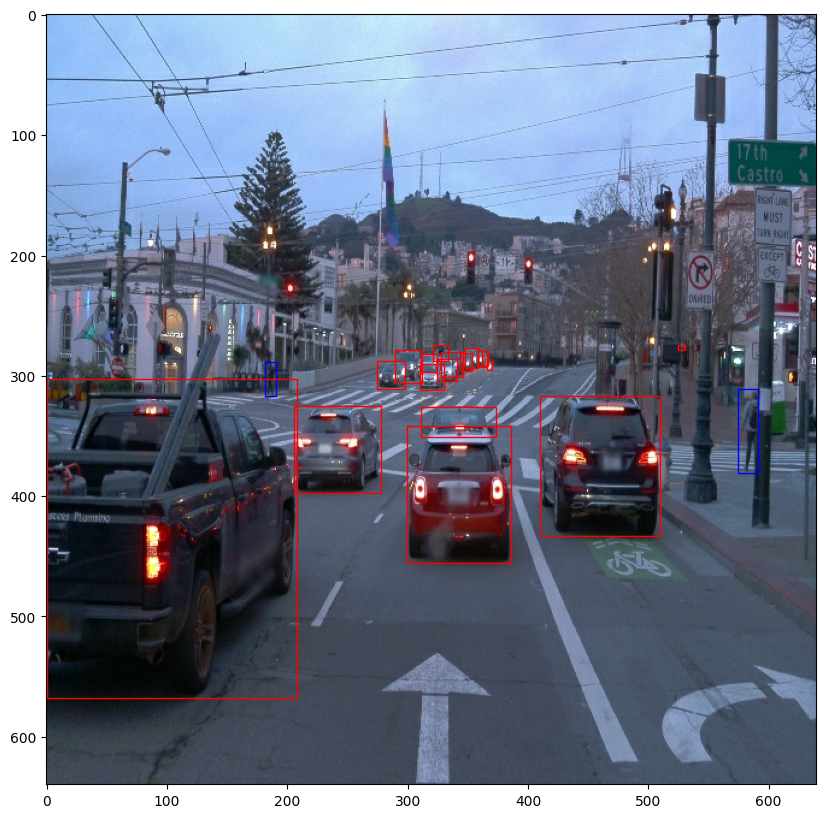

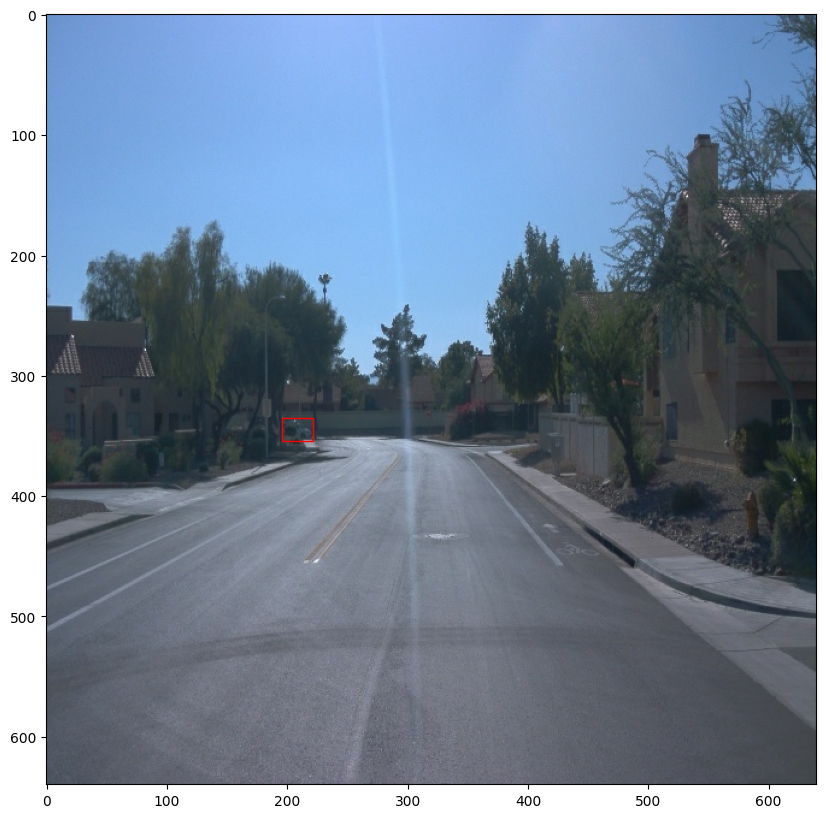

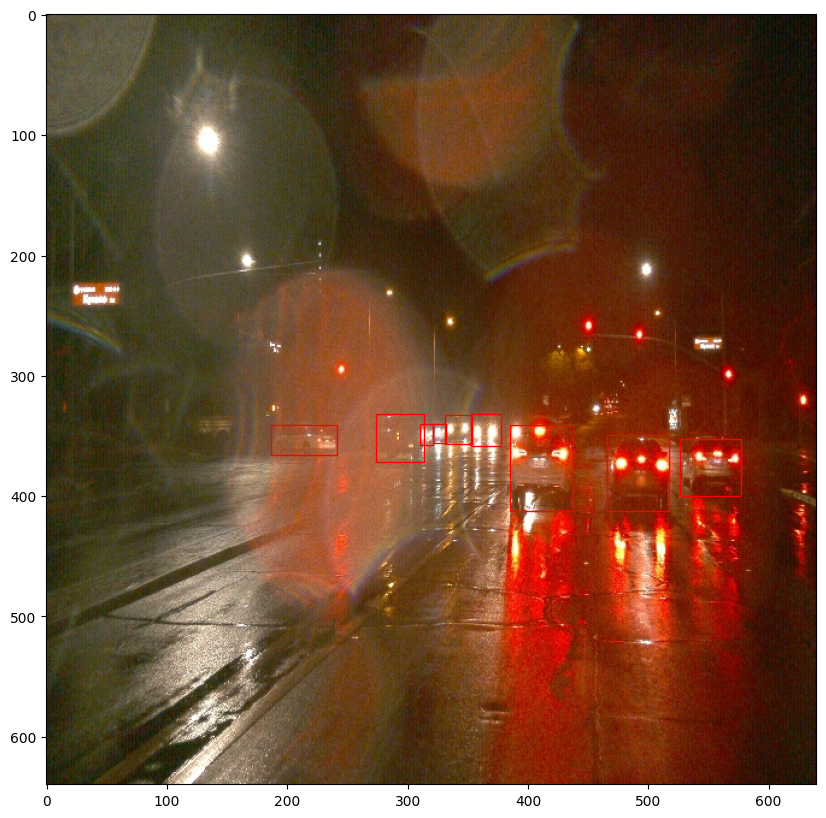

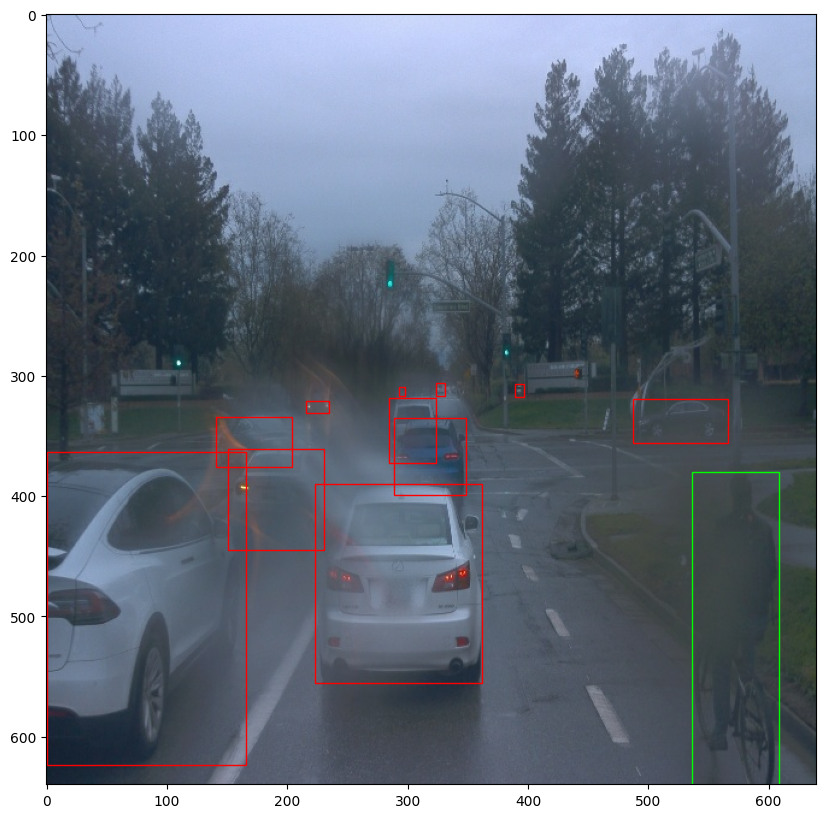

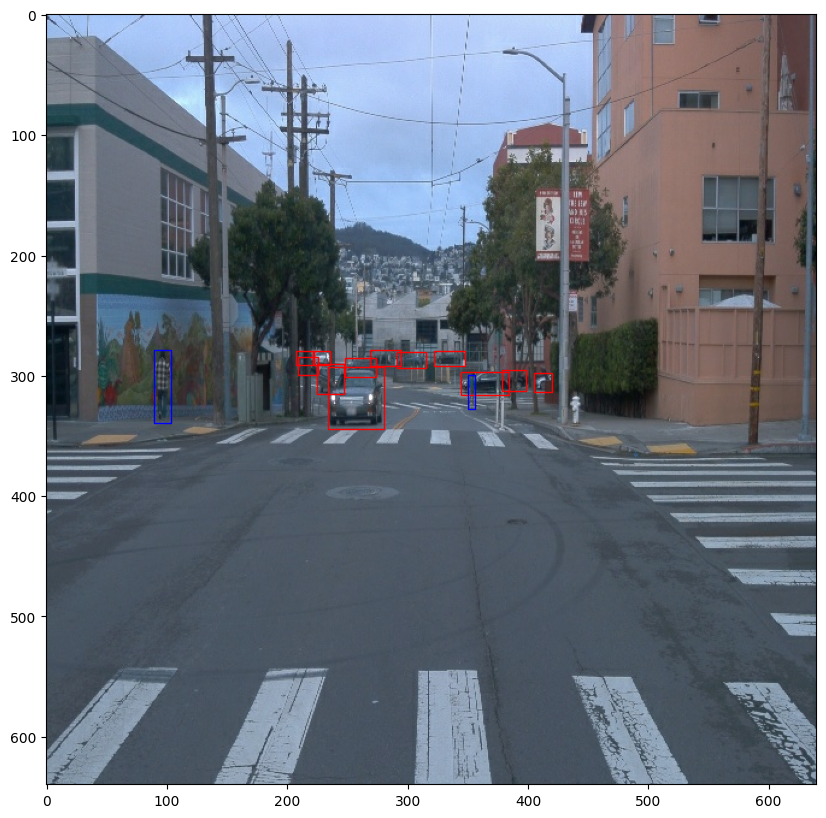

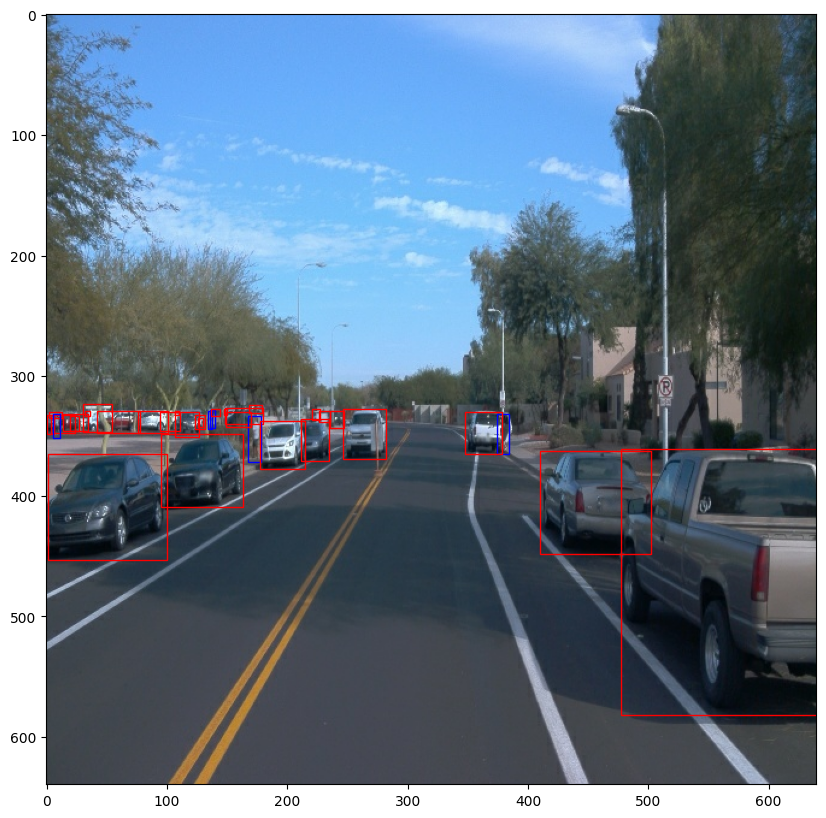

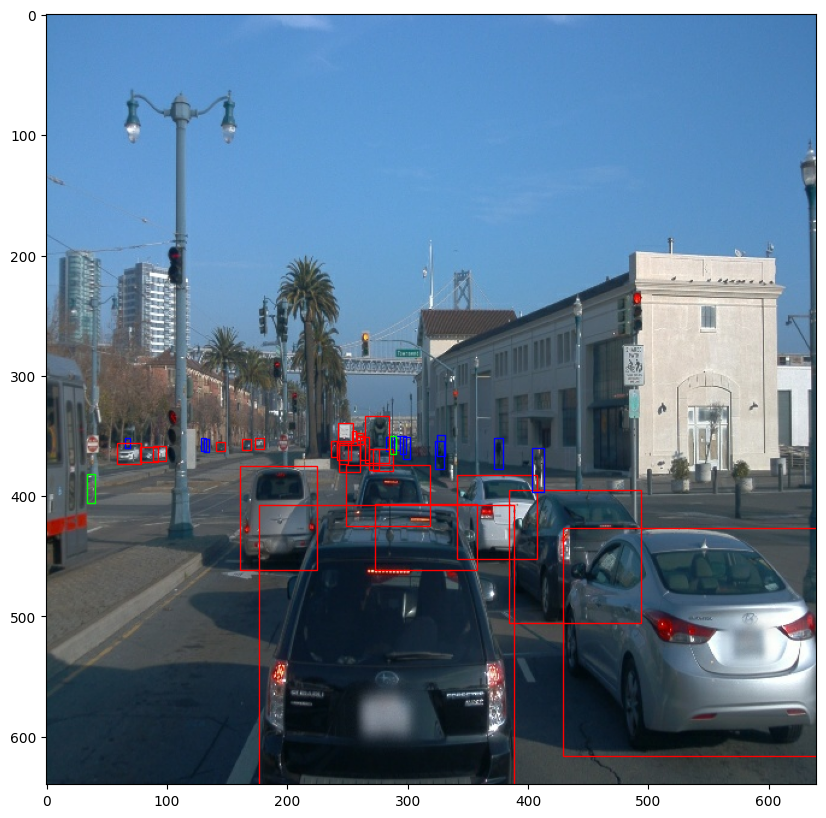

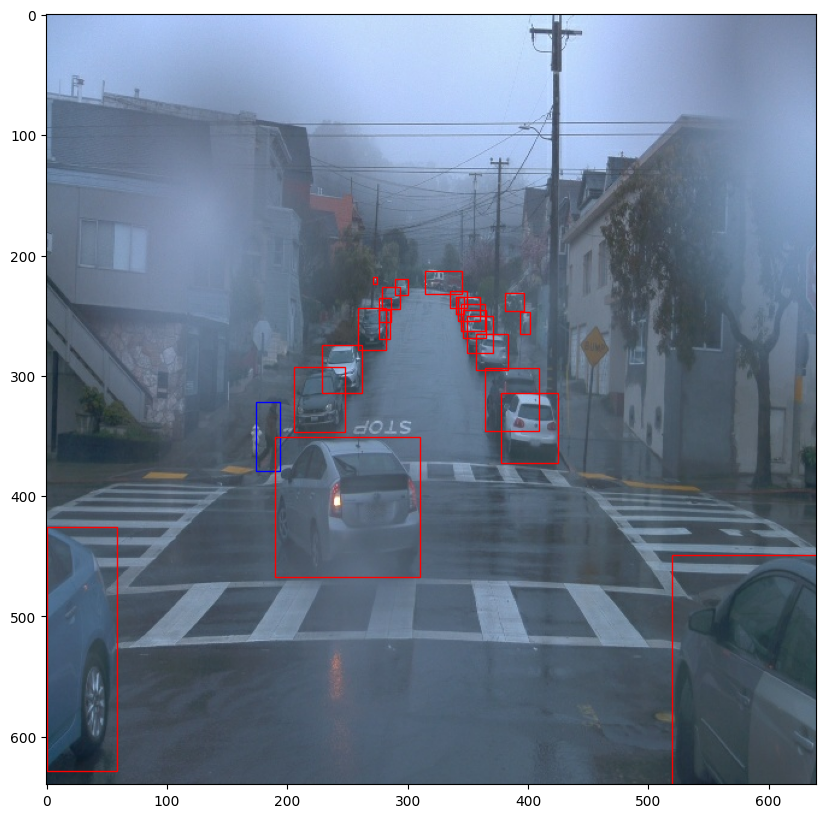

In [6]:
# Display 10 random images in dataset
dataset.shuffle(100)
for batch in dataset.take(10):
    display_images(batch)

## Additional EDA

In the dataset, the samples which have cyclists are relatively small.
The EDA below is modified to display cycliest images.

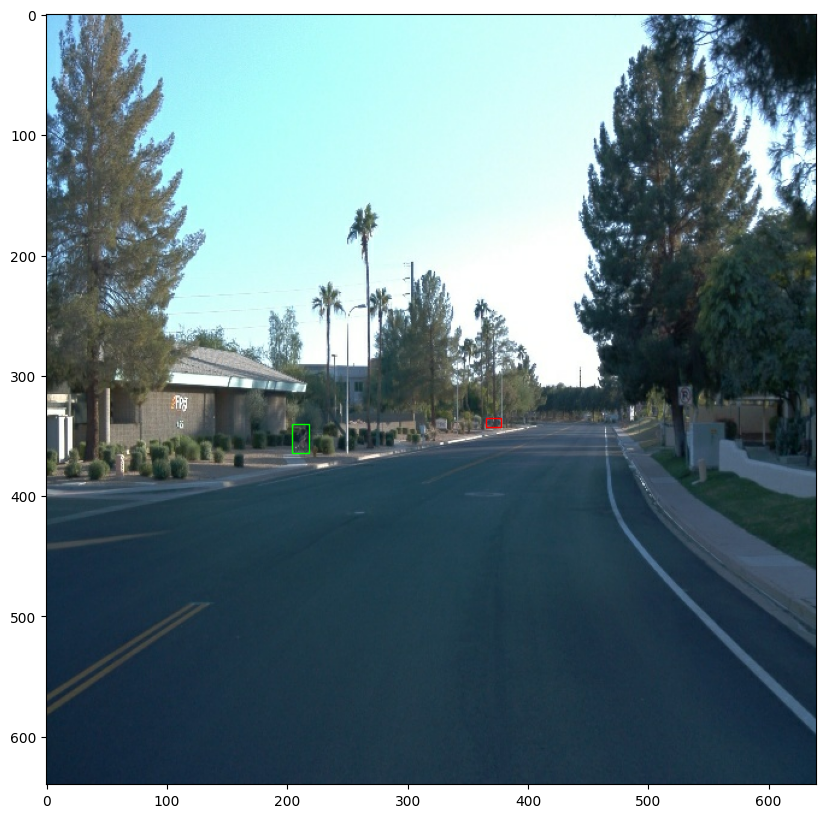

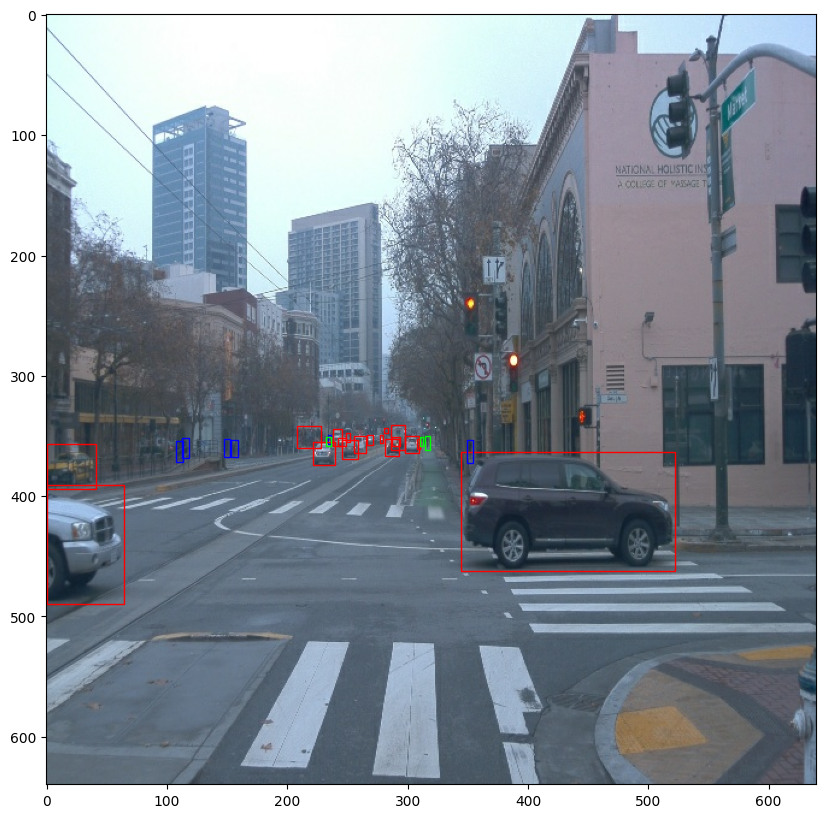

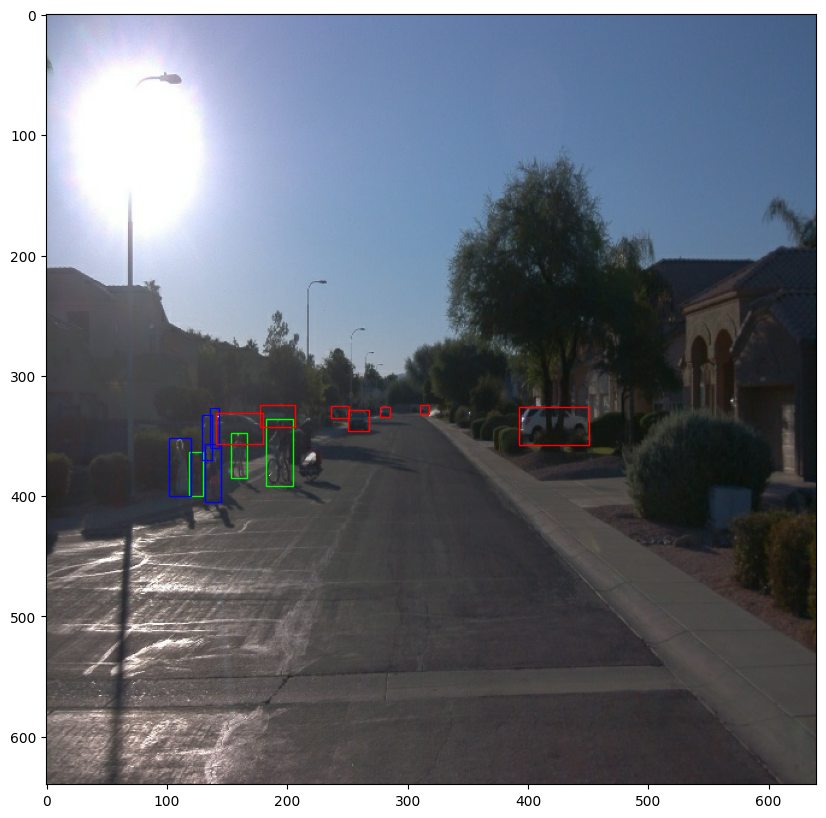

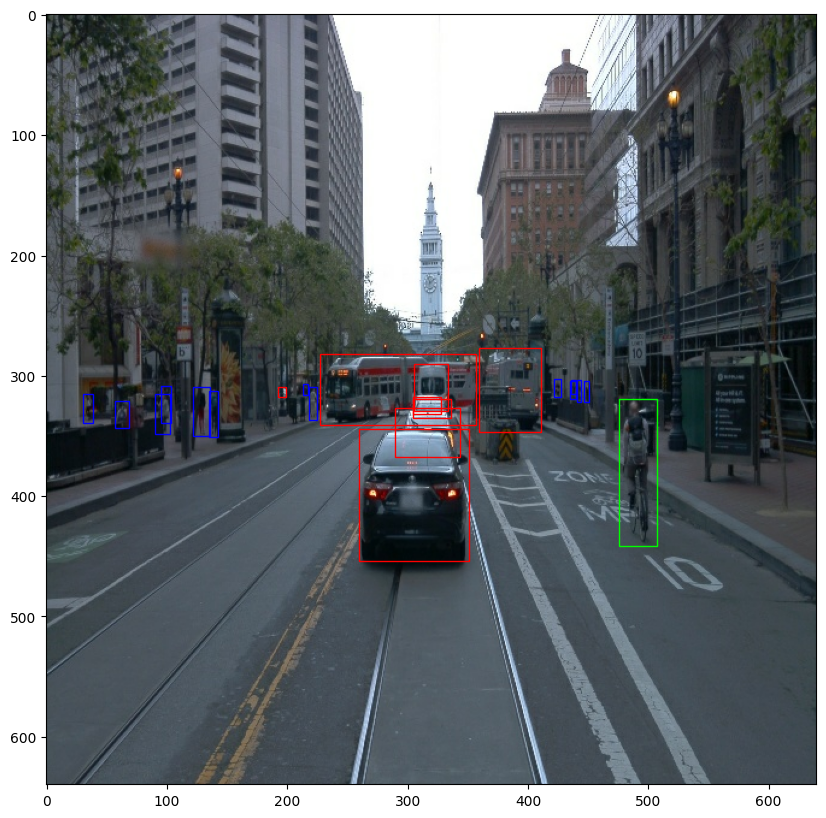

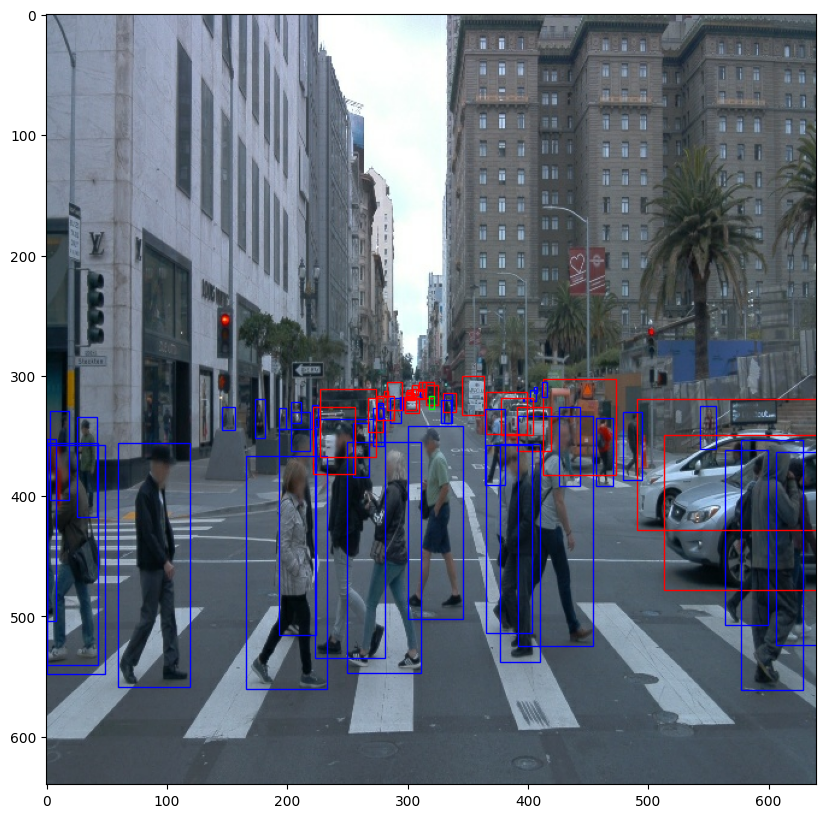

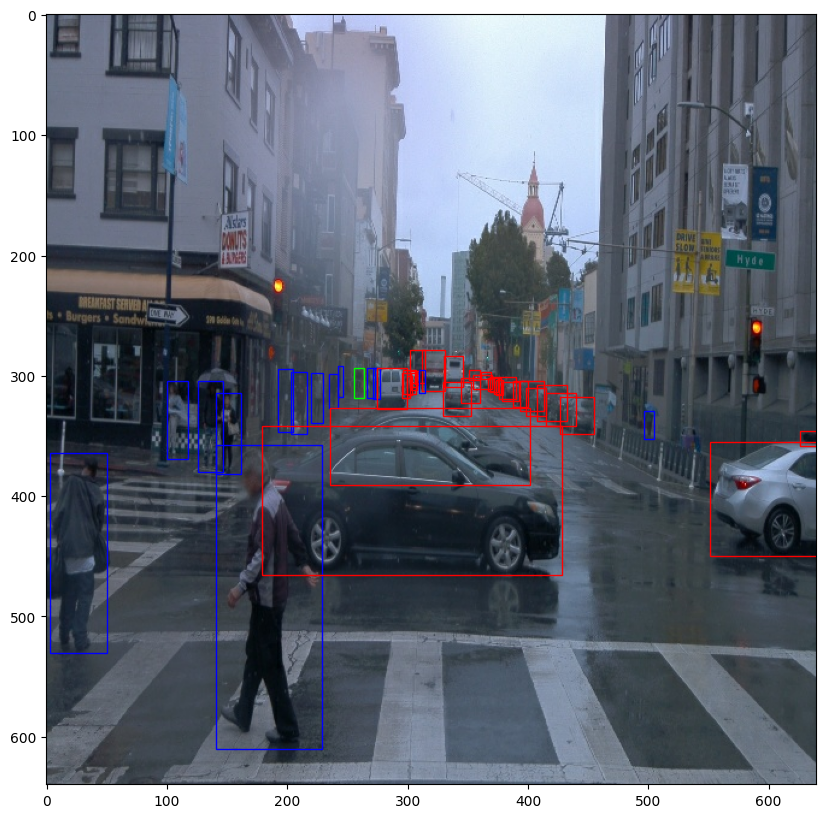

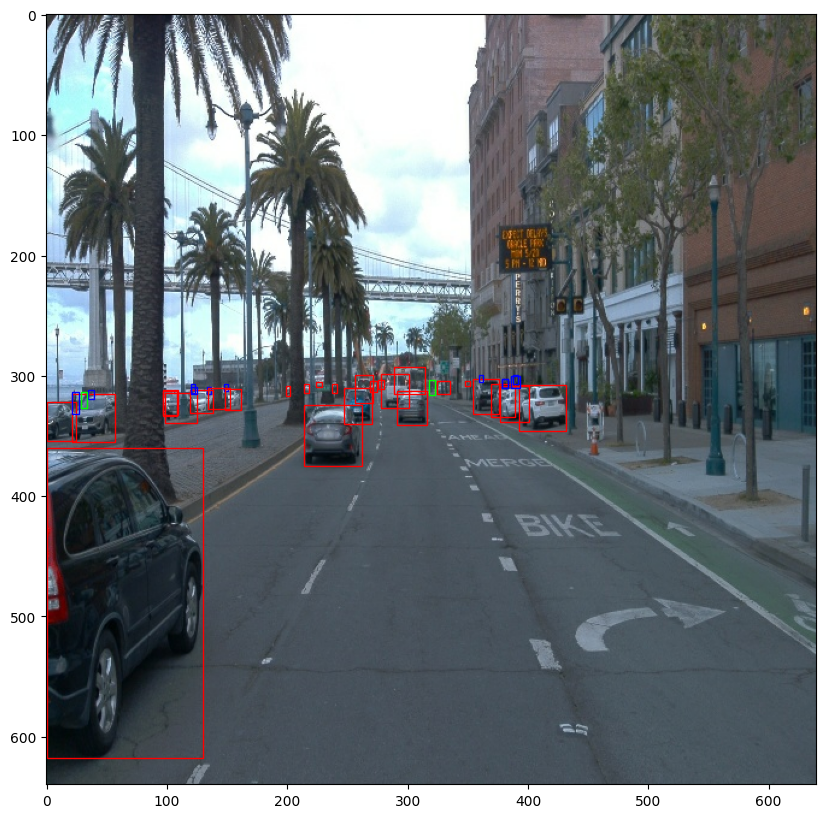

In [5]:
# Define a modifed function to display selected images with cyclist(s)

def display_cyclist_images(batch):
    
    # Parsing image and annotation data from the tfrecord batch
    img = batch['image'].numpy()
    bboxes = batch['groundtruth_boxes'].numpy()
    classes = batch['groundtruth_classes'].numpy()

    # Check if one or more cyclists exist in the batch image
    if ( 4 in classes):
        # color mapping of classes
        color_code = {1: [1, 0, 0], 2: [0, 0, 1], 4: [0, 1, 0]}

        # Setup plot size
        img_shape = img.shape
        _, ax = plt.subplots(1,figsize=(20, 10))

        # Draw bounding boxes with class colors
        for class_num, bbox_pts in zip(classes, bboxes):
            y1, x1, y2, x2 = bbox_pts
            y1 = y1*img_shape[0]
            x1 = x1*img_shape[1]
            y2 = y2*img_shape[0]
            x2 = x2*img_shape[1]
            rect = patches.Rectangle((x1, y1), x2- x1, y2-y1, facecolor='none', edgecolor=color_code[class_num])
            ax.add_patch(rect)

        # Display the image with bounding box
        imgplot = plt.imshow(img)
        plt.show()

# Randomize the tfrecord dataset and take 50 sets to check cyclist(s)
dataset.shuffle(100)
for batch in dataset.take(50):
    display_cyclist_images(batch)